# Gliding Assay Analysis

In this pipeline, we work to determine the speeds of gliding microtubules. We take a series of images of microtubules gliding on top of fixed motor proteins. We segment and extract the positions of microtubules and calculate their speeds.




First download the image data files from the server. They will be locally stored in google

Import necessary packages to run the notebook

In [1]:
#Numpy - for scientific computing
import numpy as np
import scipy

#For image reading and analysis
import glob
import skimage.io
import skimage.filters as sf
from skimage import io, measure, filters, transform, morphology

#Matplotlib plotting packages
import matplotlib.pyplot as plt

# For loading bars
from tqdm.notebook import tqdm as tqdm

# For creating DataFrames
import pandas as pd

Import images into the notebook - convert names of files to images

In [675]:
#Import Stack
file_path = '../../data/gliding/'
file_folder = 'soichi_data/2023-Feb27NcdiLid_500uM_MT200_8/images/'
included_frames = '*.tif'
im_dir = file_path+file_folder+included_frames

#Import Stack
im_stack = []
files = np.sort(glob.glob(im_dir))
for file in files:
    im_stack.append(skimage.io.imread(file).astype(np.int16))
im_stack = np.array(im_stack)

#frames = np.arange(len(im_stack))

Look at an image in the stack to see what the data looks like

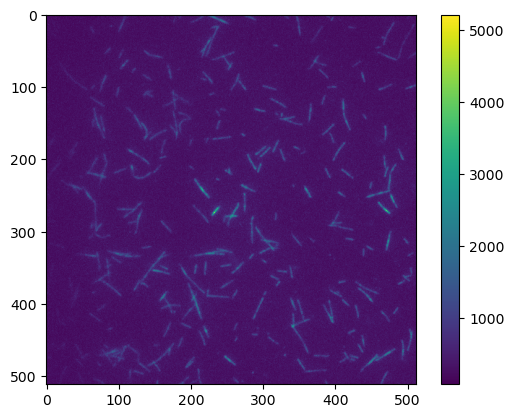

In [676]:
plt.imshow(im_stack[0])
plt.colorbar()

We will now create a maximum projection image. This will look throughout the stack of images and for each pixel, save the greatest intensity value in the stack. We will then have one 2D image.

This is helpful because it helps us identify the tracks microtubules sweep out.

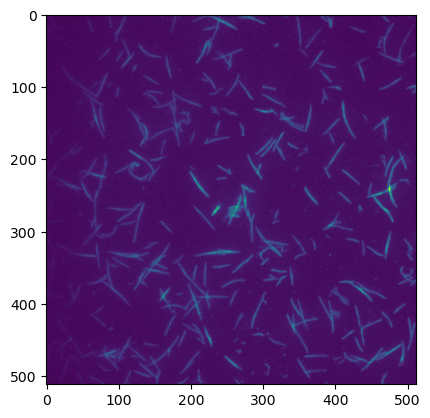

In [677]:
# Make a maximum projection from a subset of frames from im_stack
#Lets pick 50 frames
start=0
stop=50

#make max proj
im_max = np.amax(im_stack[start:stop], axis=0)

#plot
plt.imshow(im_max)

## Image Processing to clean up the maximum projection
Normalize the image

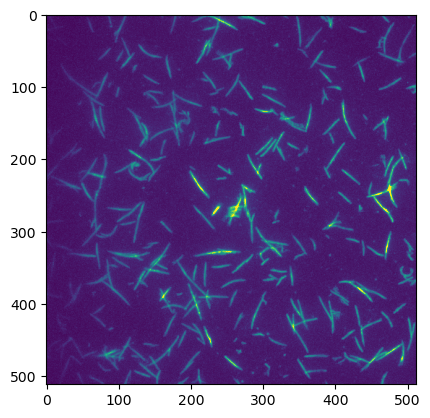

In [678]:
image_norm = (im_max - im_max.min())/(im_max.max()-im_max.min())

#plot the normalized image
plt.imshow(image_norm, vmin=0, vmax=0.5)

### Thresholding
First method: Niblack thresholding - Looks at small windows throughout the image and separates microtubules from the background. (This method is commonly used to find text especially when the background of an image has uneven illuminatiion)

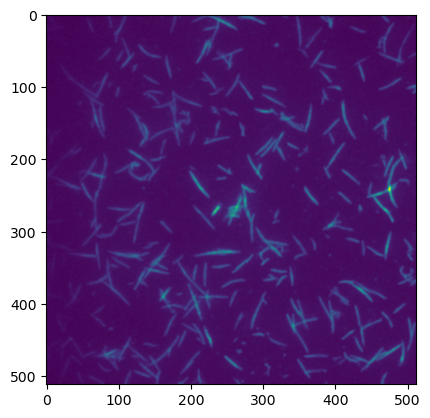

In [679]:
thresh_niblack = filters.threshold_niblack(image_norm, window_size= 3, k=0.001)
plt.imshow(thresh_niblack)

Perform Otsu thresholding - this separates the foreground from the background for the entire image

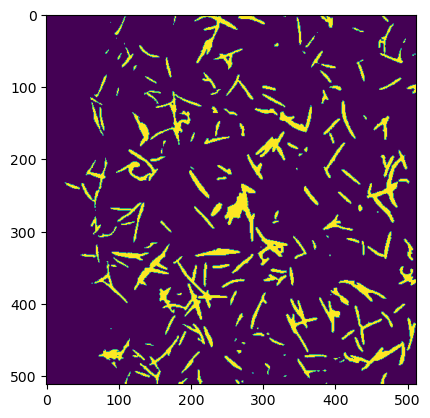

In [680]:
# define the threshold
thresh_otsu = filters.threshold_otsu(thresh_niblack)

#Make a binary image where values above the threshold are = 1 and all else is 0
im_thresh = (thresh_niblack > thresh_otsu)

#Plot
plt.imshow(im_thresh)

### Identify regions of MT tracks

Label each region and assign all pixels within that region a number. Also keep track of the number of pixels in each region

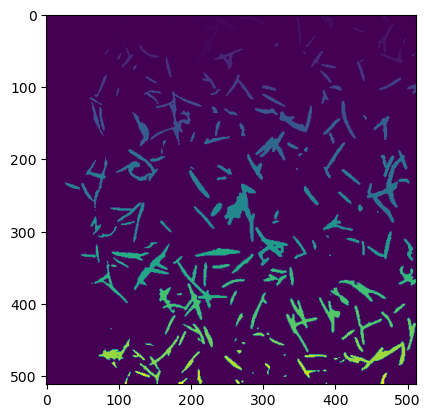

In [681]:
#make a image with each patch labeled a unique number
im_label, n_label = measure.label(im_thresh, return_num=True)

#save the unique labels
unique_regions, region_counts = np.unique(im_label, return_counts = True)

#plot
plt.imshow(im_label)

### Remove non-linear tracks

Remove patches too close to the edges

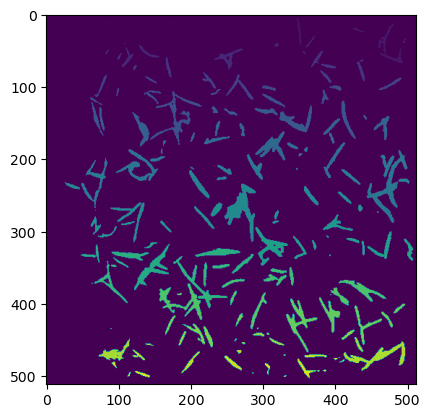

In [682]:
#give some border width
edge = 3

#make an image that will have the border removed
im_border = np.copy(im_label)

#Make the border mask
border = np.ones(np.shape(im_label))
border[edge:-1*edge, edge:-1*edge] -=1

#Ask if there is a nonzero label within the border region and if so remove that patch
for n in np.unique(im_border):
    if np.any(border*[im_border==n+1]):
        im_border[im_border==n+1] = 0

#Save image with border patches eliminated
im_internal = im_border

#plot
plt.imshow(im_internal)

Remove small objects. We set a defined area which each patch must be greater than. Note in this data, 1µm = 6.2 pixels

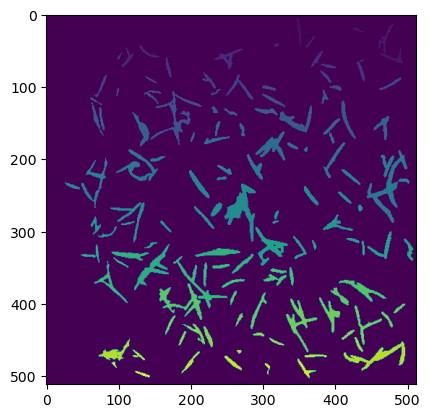

In [683]:
# Define a size threhshold
area_thresh = 20

#Make a dictionary that connects the region label number and the number of pixels within said region
dict_area = dict(zip(unique_regions, region_counts))

#Want to find if each patch is big enough
im_sized = np.copy(im_internal)
for label in unique_regions:
  #ask if region is larger than threshold
  if label>0 and dict_area[label]<=area_thresh:
    im_sized[im_sized==label] = 0

#plot
plt.imshow(im_sized)

Thin each region to create a skeleton while preserving the connectivity of each region.

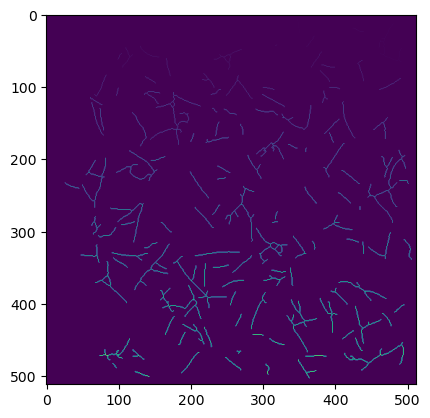

In [684]:
#create skeletons that preserve connectivity
im_thinned = morphology.thin(im_sized)

#Relabel so each skelton has its own label I.D
im_relabel = measure.label(im_thinned)

#plot
plt.imshow(im_relabel)

Use a Hough Transform to identify linear regions. This transform looks at all the lines that could pass through a given point in the labeled region. For each line, the transform measures the length of the normal to the line from the origin and its angle. Performing this process for each point in the labeled region, the transform declares a line to be at the angle where the normal to the line passing through each point has the same length.

In [685]:
len(np.unique(im_relabel))/5

25.2

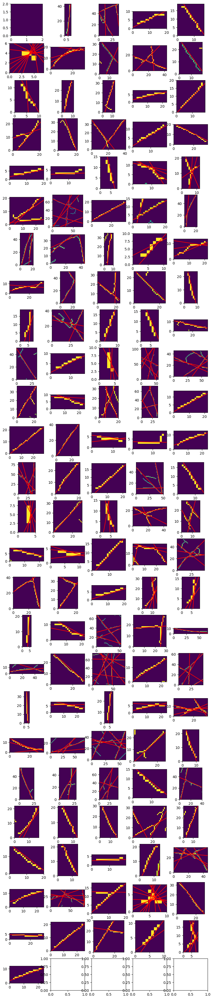

In [686]:
fig, ax = plt.subplots(int(len(np.unique(im_relabel))/5)+1, 5, figsize = (10, 50))
figj = 0
figi = 0

#Define angles to test lines over
test_angles = np.linspace(-np.pi / 2, np.pi / 2, 360)

for n in np.unique(im_relabel):
    padding = 3
    min_dist = 9
    min_angle=20
    x,y = np.where(im_relabel==n)
    mt_segment = np.copy(im_relabel)[x.min()-padding:x.max()+padding,y.min()-padding:y.max()+padding]
    #mt_segment[mt_segment!=39] = 0
    ax[figj][figi].imshow(mt_segment)

    h, theta, d = transform.hough_line(mt_segment, theta=test_angles)
    _, angles, _ = transform.hough_line_peaks(h, theta, d, 
                                                min_distance=min_dist,
                                                min_angle=min_angle,)
                                                #num_peaks=2)

    for _, angle, dist in zip(*transform.hough_line_peaks(h, theta, d,min_distance=min_dist, min_angle=min_angle) ):
        (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
        ax[figj][figi].axline((x0, y0), slope=np.tan(angle + np.pi/2), color='r')
    ax[figj][figi].set_xlim(0, len(mt_segment[0])-1)
    ax[figj][figi].set_ylim(0, len(mt_segment)-1)
    
    if figi<4:
        figi+=1
    else:
        figi=0
        figj+=1


array([-1.75487465, 51.39275766])

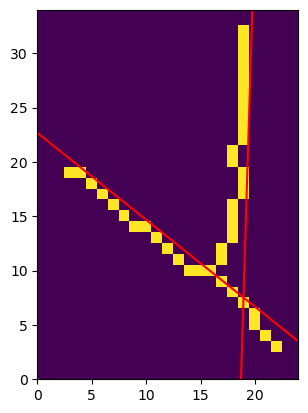

In [687]:
padding = 3
min_dist = 9
min_angle=20
x,y = np.where(im_relabel==37)
mt_segment = np.copy(im_relabel)[x.min()-padding:x.max()+padding,y.min()-padding:y.max()+padding]
#mt_segment[mt_segment!=39] = 0
plt.imshow(mt_segment)

h, theta, d = transform.hough_line(mt_segment, theta=test_angles)
_, angles, _ = transform.hough_line_peaks(h, theta, d, 
                                            min_distance=min_dist,
                                            min_angle=min_angle,)
                                            #num_peaks=2)
    
for _, angle, dist in zip(*transform.hough_line_peaks(h, theta, d,min_distance=min_dist, min_angle=min_angle) ):
    (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
    plt.axline((x0, y0), slope=np.tan(angle + np.pi/2), color='r')
plt.xlim(0, len(mt_segment[0])-1)
plt.ylim(0, len(mt_segment)-1)

angles*180/np.pi

check for diagonal touching regions

array([0], dtype=int32)

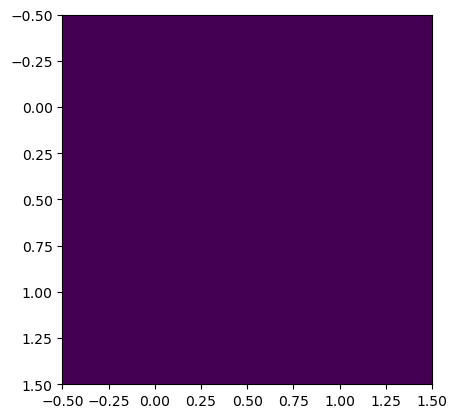

In [688]:
plt.imshow(im_relabel[100:102, 125:127])
np.unique(im_relabel[100:102, 125:127])

In [689]:
w=3
for j in range(len(im_relabel)-w):
    for i in range(len(im_relabel[0])-w):
        if len(np.unique(im_relabel[j:j+w, i:i+w]))>2:
            print(np.unique(im_relabel[j:j+w, i:i+w]))

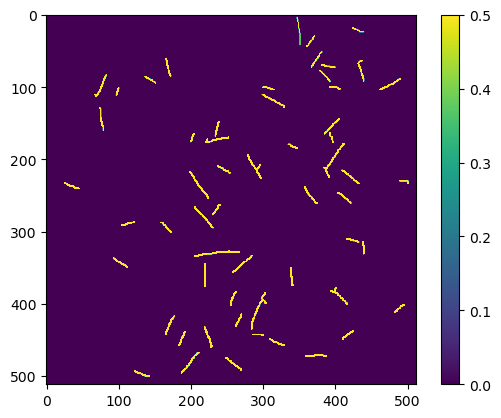

In [690]:
# Set scanning parameters
padding=3 #3
min_dist=9 #9
min_angle=20 #75

# Make a copy of the image
im_cleaned = im_relabel.copy()

#Define angles to test lines over
test_angles = np.linspace(-np.pi / 2, np.pi / 2, 360)

#Perform the transform for each labeled region
for n in np.unique(im_relabel)[1:]:
    x,y = np.where(im_relabel==n)
    mt_segment = im_relabel[x.min()-padding:x.max()+padding,y.min()-padding:y.max()+padding]

    h, theta, d = transform.hough_line(mt_segment, theta=test_angles)
    _, angles, _ = transform.hough_line_peaks(h, theta, d, 
                                            min_distance=min_dist,
                                            min_angle=min_angle,
                                            num_peaks=2)
    
    # If more than one line is fit to the region, eliminate the region from our image
    if len(angles)>=2:
        im_cleaned = np.where(im_cleaned==n, 0, im_cleaned)

#Plot
plt.imshow(im_cleaned, vmin=0, vmax=0.5)
plt.colorbar()

Extract properties of each region (i.e. major axis length, oreientation, etc.)

In [691]:
# Determine properties - we will need the centroid, major axis length etc
im_props = measure.regionprops_table(im_cleaned, 
                                     im_max, 
                                     properties = ['area', 
                                                    'major_axis_length', 
                                                    'minor_axis_length', 
                                                    'centroid', 
                                                    'orientation', 
                                                    'label'])
#Save as dataframe
df = pd.DataFrame(im_props)

#Show the dataframe
df

,area,major_axis_length,minor_axis_length,centroid-0,centroid-1,orientation,label
0,39,45.284171,1.861764,23.000000,349.769231,0.108463,1
1,16,19.842269,1.794956,21.937500,431.500000,1.190831,3
2,16,22.289795,1.450021,37.437500,365.750000,-0.628258,4
3,22,30.608895,1.214793,62.500000,373.681818,-0.593872,9
4,25,29.639898,1.489571,73.000000,168.440000,0.232503,11
5,31,35.780990,5.303255,77.129032,435.580645,0.213642,12
6,19,22.344500,1.381642,71.789474,390.000000,1.372633,13
7,16,24.921043,1.174350,85.500000,386.187500,0.738886,14
8,32,39.530580,3.354868,99.312500,75.968750,-0.438967,16
9,15,20.134454,1.165899,90.333333,144.000000,1.030998,18


## Determine a MT Track
Find the pixels that fall on the line of the MT track.

In [692]:
# Define a function
def mt_track(xc, yc, l, theta):
    # Ensure that theta is not greater than pi
    if theta >= np.pi:
        theta = theta - np.pi
  
  # If the track is more horizontal, find the x values for pixels falling along 
  #the line, then determine the corresponding y values
    if np.abs(theta) <= np.pi/4 or np.abs(theta)>3*np.pi/4:
        xvals = np.arange(xc-np.abs(0.5*l*np.cos(theta)), xc + np.abs(0.5*l*np.cos(theta)))
        yvals = ( np.tan(theta)*xvals ) + ( yc - np.tan(theta)*xc )
        
  # If the track is more vertical, find the y values for pixels falling along 
  # the line, then determine the x values
    else:
        yvals = np.arange(yc - np.abs(0.5*l*np.sin(theta)), yc + np.abs(0.5*l*np.sin(theta)))
        xvals = (yvals/np.tan(theta) + (xc - yc/np.tan(theta)))
  
  # Return the x and y values
    return xvals, yvals

Visualize the line overlapping with the MT track

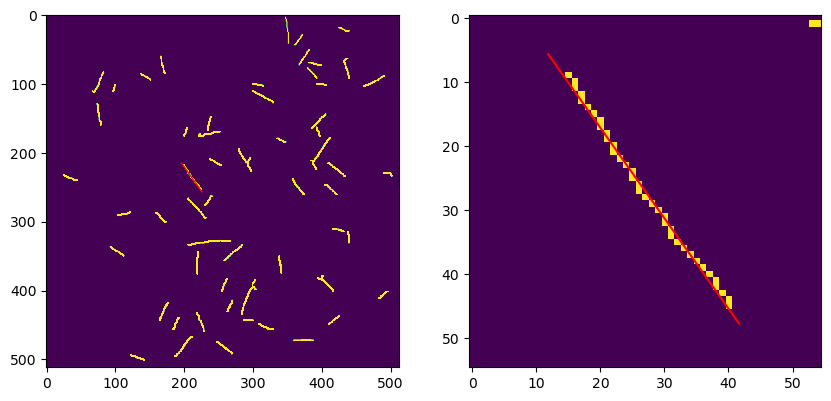

In [693]:
# Identify the MT you wish to look at
i = 26

# Identify the line parameters
xc =  df.loc[i, 'centroid-1']
yc =  df.loc[i, 'centroid-0']
lmajor =  df.loc[i, 'major_axis_length']
theta = -df.loc[i, 'orientation'] + (np.pi/2)

#Define the line
xmajor, ymajor = mt_track(xc, yc, lmajor, theta)

#### --------------------- PLOT!!!----------------------####
fig, ax = plt.subplots(1,2, figsize=(10,5))

#### Full frame view ####
ax[0].imshow(im_cleaned, vmin=0, vmax=0.5)
ax[0].plot(xmajor, ymajor, color='r', lw=1)

#### Cropped view ####
#Define the cropped coordinates
crop_win = int(lmajor/2+1)
crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
cropmajx = xmajor-xc + crop_win
cropmajy = ymajor-yc + crop_win

ax[1].imshow(im_cleaned[crop], vmin=0, vmax=0.5)
ax[1].plot(cropmajx, cropmajy, color='r')

## Create a Kymograph
We will calculate the speed of microtubules by looking at the slope of the kymograph along the track line we defined. The kymograph plots time vs distance allowing us to determine a speed.

Text(0.5, 0, 'Position (161 nm)')

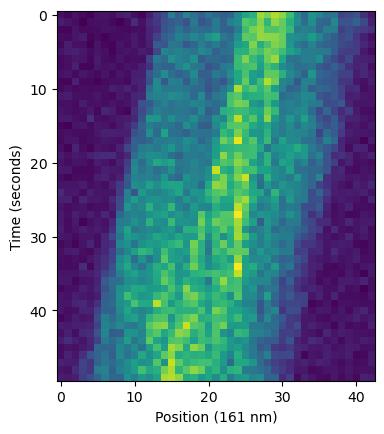

In [694]:
mykymo = []

#loop through image stack and pull out every intensity along the defined line
for im in im_stack[start:stop]:
  #list to save each intensity for a given image
    ls = []
    for i in range(len(xmajor)):
        #add the intensity at every point to the list
        ls.append(im[int(ymajor[i]), int(xmajor[i])])
    mykymo.append(ls)

#save as array
mykymo = np.array(mykymo)

#plot
plt.imshow(mykymo)
plt.ylabel('Time (seconds)')
plt.xlabel('Position (161 nm)')

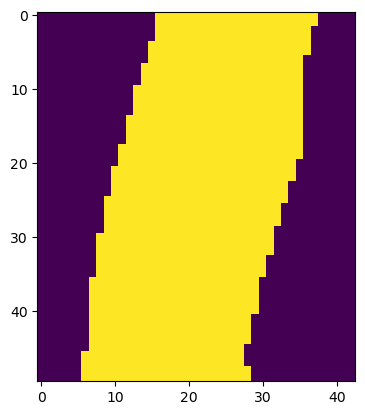

In [695]:
# Create a gaussian blur
gauss = sf.gaussian(mykymo, sigma = 2)

#Threshold
kymo_otsu = sf.threshold_otsu(gauss)
im_thresh = gauss>kymo_otsu
plt.imshow(im_thresh)

### Write a function to fit the kymograph to get the speed of the microtubule

Scheme: threshold the kymograph image to get a binary image. 2) Find the centroid of each MT length. 3) Fit a line to the centroids and the inverse slope is the speed.

In [696]:
def kymo_func(kymo, sigma_in, pixel_size, plot=False):
    """
  params: kymo: image
          sigma: for the gaussian blur
          pixel_size: convert pixels to um
          plot: (boolean) if you want to print the plot

  returns: speed
           rsqrd: r-squared squared value of the fit to the kymograph
           [mfit, bfit]: list of fit parameters
           frames: time values
           row_coms[frames]: center of mass of the MT at each time value

    """

  # Create a gaussian blur
    gauss = sf.gaussian(kymo, sigma = sigma_in)

  #Threshold
    kymo_otsu = sf.threshold_otsu(gauss)
    im_thresh = gauss>kymo_otsu

  #Find the center of mass for each row (time)
    row_coms = []
  #loop through each timepoint and get the C.O.M
    for i, row_vals in enumerate(im_thresh):
        #Compute the C.O.M
        xdex = np.arange(len(row_vals))
        xcom = np.sum(row_vals*xdex)/np.sum(row_vals)
        row_coms.append(xcom)

    #convert to array
    row_coms=np.array(row_coms)

    #make sure there is no 'nans'
    frames = np.where(~np.isnan(row_coms))[0]


    #Fit a line
    mfit_inv, bfit_inv = np.polyfit(frames, row_coms[frames], deg=1)
    mfit = 1/mfit_inv
    bfit = -bfit_inv/mfit_inv

    #Calculate the speed (nm/s)!
    speed = 1000*pixel_size/np.abs(mfit)

    #Compute the r^2 value of the fit
    ss_res = np.sum((frames - (mfit*row_coms[frames] + bfit))**2)
    ss_tot = np.sum((frames - np.average(frames))**2)
    rsqrd = 1 - (ss_res/ss_tot)


    return speed, rsqrd, [mfit,bfit], frames, row_coms[frames]

Look at the fit line and center of masses over the kymograph

Text(0.5, 1.0, 'speed = 34.26 nm/s')

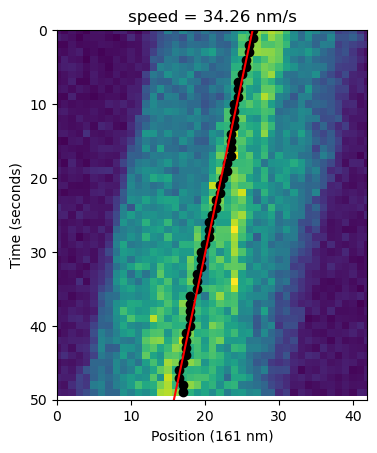

In [697]:
#Try plotting all the C.O.M on top of the kymograph
plt.imshow(mykymo)

#Find the center of masses for each row of our defined kymograph
speed, rsquared, params, frames, row_coms = kymo_func(mykymo, sigma_in=2, pixel_size=0.161)

# plot the C.O.M
plt.scatter(row_coms, frames, color='k')
plt.plot(frames, params[0]*frames+params[1], color='r')
plt.ylim(50, 0)
plt.xlim(0, len(mykymo[0])-1)
plt.ylabel('Time (seconds)')
plt.xlabel('Position (161 nm)')
plt.title('speed = ' + str(round(speed,2)) + ' nm/s')

For all MT tracks, plot the kymographs with the start, stop and max projection images

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)


Text(0.5, 1.0, 'Kymograph')

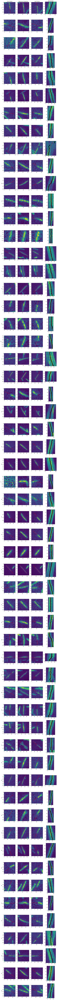

In [698]:
fig, ax = plt.subplots(len(df), 4, figsize = (12, 4*len(df)))

#iterate through each MT track
for i in range(len(df)):

    #Define the fit to the track
    xc =  df.loc[i, 'centroid-1']
    yc =  df.loc[i, 'centroid-0']
    lmajor =  df.loc[i, 'major_axis_length']
    lminor =  df.loc[i, 'minor_axis_length']
    theta = -df.loc[i, 'orientation'] + (np.pi/2)

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

    crop_win = int(lmajor/2+1)
    crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
    
    cropmajx = xmajor-xc + crop_win 
    cropmajy = ymajor-yc + crop_win 
    
    #plot the first, last, and max proj images
    ax[i][0].imshow(im_stack[start][crop])
    ax[i][1].imshow(np.amax(im_stack[start:stop], axis=0)[crop])
    ax[i][2].imshow(im_stack[stop-1][crop])
    
    #plot the fit line
    ax[i][0].plot(cropmajx, cropmajy, color='r')
    ax[i][1].plot(cropmajx, cropmajy, color='r')
    ax[i][2].plot(cropmajx, cropmajy, color='r')
    
    ax[i][0].set_ylabel(i)
    
    #create a kymograph
    mykymo = []
    for im in im_stack[start:stop]:
        ls=[]
        for j in range(len(xmajor)):
            ls.append(im[int(ymajor[j]), int(xmajor[j])])
        mykymo.append(ls)
    mykymo = np.array(mykymo)

    #Fit the kymograph and determine the speed
    speed, rsqrd, lineparams, plot_frames, kymo_COMs = kymo_func(mykymo, sigma_in = 2, pixel_size = 0.161)
    
    #Plot the kymograph and the fit
    ax[i][3].imshow(mykymo)
    ax[i][3].scatter(kymo_COMs, plot_frames, color='k')
    xdex = np.arange(len(mykymo[0]))
    ax[i][3].plot(xdex, lineparams[0]*xdex+lineparams[1], color='r')
    ax[i][3].set_ylim(0, len(mykymo)-1)

ax[0][0].set_title('First Frame')
ax[0][1].set_title('Maximum Projection')
ax[0][2].set_title('Last Frame')
ax[0][3].set_title('Kymograph')

Add speed values and r-squared values to the DataFrame

In [699]:
#Create empty lists for the speeds, r-squared values, and the number of centroids for each kymograph
speeds=[]
r2 = []
num_centr = []

#Iterate through each MT track
for i in range(len(df)):

    # Define the line fitting the track
    xc =  df.loc[i, 'centroid-1']
    yc =  df.loc[i, 'centroid-0']
    l =  df.loc[i, 'major_axis_length']
    theta = -df.loc[i, 'orientation'] + (np.pi/2)
    
    xtrack, ytrack = mt_track(xc, yc, l, theta)
    
    #Ensure there is more than one point saved in the track line
    if len(xtrack)>1:

      # Create a kymograph
        mykymo = []

        for im in im_stack[10:61]:
            ls=[]
            for i in range(len(xtrack)):
                if int(ytrack[i])<512 and int(xtrack[i])<512:
                    ls.append(im[int(ytrack[i]), int(xtrack[i])])
            mykymo.append(ls)
        mykymo = np.array(mykymo)

        # Compute the fit to the kymograph
        speed, rsqrd, lineparam, COM_frames, kymo_COMs = kymo_func(mykymo, sigma_in = 2, pixel_size = 0.161)
        
        #Append the fit results to the empty lists
        num_centroids = len(COM_frames)
        speeds.append(speed)
        r2.append(rsqrd)
        num_centr.append(num_centroids)
    
    #if there is fewer than two centroids detected in the kymograph drop the track
    else:
        df=df.drop([i])

# Include the new columns in the DataFrame
speeds = np.array(speeds)
r2 = np.array(r2)
num_centr = np.array(num_centr)
df['speed (nm/s)'] = speeds
df['r^2'] = r2
df['num points'] = num_centr

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)


Eliminate any poor fits by only keeping tracks that have fits with an r-squared value greater than 0.8.

In [700]:
df_good = df[df['r^2']>0.8]
df_good

,area,major_axis_length,minor_axis_length,centroid-0,centroid-1,orientation,label,speed (nm/s),r^2,num points
0,39,45.284171,1.861764,23.000000,349.769231,0.108463,1,55.759910,0.991170,51
1,16,19.842269,1.794956,21.937500,431.500000,1.190831,3,49.757458,0.985254,40
3,22,30.608895,1.214793,62.500000,373.681818,-0.593872,9,27.879955,0.965096,51
4,25,29.639898,1.489571,73.000000,168.440000,0.232503,11,29.650226,0.922690,51
5,31,35.780990,5.303255,77.129032,435.580645,0.213642,12,34.349095,0.980037,51
6,19,22.344500,1.381642,71.789474,390.000000,1.372633,13,32.979502,0.937797,51
7,16,24.921043,1.174350,85.500000,386.187500,0.738886,14,17.433167,0.924395,51
9,15,20.134454,1.165899,90.333333,144.000000,1.030998,18,28.783303,0.970187,51
14,32,41.773962,1.165321,119.187500,314.468750,1.074013,27,36.163077,0.992799,51
15,31,36.229436,1.989108,145.000000,76.322581,0.158429,32,41.233484,0.991780,51


Show only the good MT tracks and the fitted kymographs

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/1201491444.py:29: RuntimeWarning: invalid value encountered in long_scalars
  xcom = np.sum(row_vals*xdex)/np.sum(row_vals)


Text(0.5, 1.0, 'Kymograph')

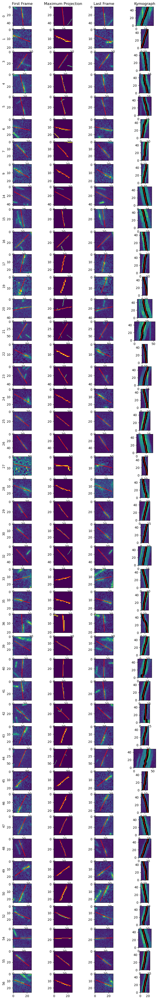

In [701]:
fig, ax = plt.subplots(len(df_good), 4, figsize = (9, len(df)))
for i, index in enumerate(df_good.index):
    xc =  df_good.loc[index, 'centroid-1']
    yc =  df_good.loc[index, 'centroid-0']
    lmajor =  df_good.loc[index, 'major_axis_length']
    lminor =  df_good.loc[index, 'minor_axis_length']
    theta = -df_good.loc[index, 'orientation'] + (np.pi/2)

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

    crop_win = int(lmajor/2+1)
    crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
    
    cropmajx = xmajor-xc + crop_win 
    cropmajy = ymajor-yc + crop_win 
    
    ax[i][0].imshow(im_stack[start][crop])
    ax[i][1].imshow(im_cleaned[crop])
    ax[i][2].imshow(im_stack[stop-1][crop])
    
    ax[i][0].plot(cropmajx, cropmajy, color='r')
    ax[i][1].plot(cropmajx, cropmajy, color='r')
    ax[i][2].plot(cropmajx, cropmajy, color='r')
    
    ax[i][0].set_ylabel(index)

    mykymo = []
    for im in im_stack[start:stop]:
        ls=[]
        for j in range(len(xmajor)):
            ls.append(im[int(ymajor[j]), int(xmajor[j])])
        mykymo.append(ls)
    mykymo = np.array(mykymo)
    speed, rsqrd, lineparams, plot_frames, kymo_COMs = kymo_func(mykymo, sigma_in = 2, pixel_size = 0.161)
    ax[i][3].imshow(mykymo)
    ax[i][3].scatter(kymo_COMs, plot_frames, color='k')
    xdex = np.arange(len(mykymo[0]))
    ax[i][3].plot(xdex, lineparams[0]*xdex+lineparams[1], color='r')
    ax[i][3].set_ylim(0, len(mykymo)-1)

ax[0][0].set_title('First Frame')
ax[0][1].set_title('Maximum Projection')
ax[0][2].set_title('Last Frame')
ax[0][3].set_title('Kymograph')

Plot a histogram of the gliding speeds

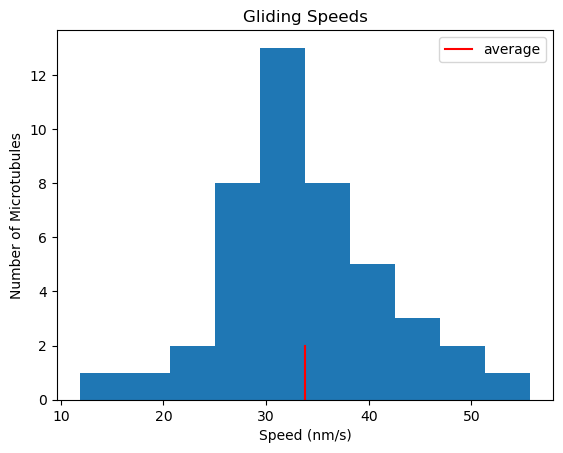

In [702]:
#plot a histogram
plt.hist(df_good['speed (nm/s)'])

#put a line at the average speed
avgspeed = np.average(df_good['speed (nm/s)'])
plt.plot([avgspeed, avgspeed], [0,2], color='r', label = 'average')

#Axis labels
plt.title('Gliding Speeds')
plt.xlabel('Speed (nm/s)')
plt.ylabel('Number of Microtubules')
plt.legend()

For context, Joe Howard's book references 

deCastro, M. et al. "Motility of dimeric ncd on a metal-chelating surfactant: evidence that ncd is not processive." Biochemistry (1999)

for measurements of NCD motor speeds. This paper quotes a maximum speed of 190 nm/s with a Menten constant for the dependence on ATP concentration of 235 µM. This data we analyze here is at 500 µM. Rachel's paper measures our NCD motors to walk with a maximum speed of 115 nm/s at saturating ATP conditions. This is likely due to the fact that additional domains on our motors, such as the dimerization protein and fluorophore, cause the more massive motor to move slower. I look forward to measureing gliding speeds over varying ATP, ADP, and phosphate levels to accurately understand the effects of ATP and competitive inhibition on our motor speeds.

# Kymo Fitting with skeleton in pipeline

Define functions to threshold the kymograph, and fit based on the centroid and skeleton methods. The centroids seem to fit the tracks the best in terms of looking like they produce the more accuratte speed line in the center of the kymograph. Using the skeleton can help rule out kymographs that split. For example when there are two MT in the feild of veiw.

In [703]:
def kymothresh(kymo, sigma):
  # Create a gaussian blur
    gauss = sf.gaussian(kymo, sigma = sigma)
    kymo_thresh = gauss
  #Threshold
    # kymo_otsu = sf.threshold_otsu(gauss)
    # kymo_thresh = gauss>kymo_otsu
    
    return kymo_thresh

def skeletonfit(kymo_thresh, pixel_size):
    kymo_otsu = sf.threshold_otsu(kymo_thresh)
    kymo_thresh = kymo_thresh>kymo_otsu
    kymo_thin = morphology.thin(kymo_thresh)
    xvals = np.where(kymo_thin)[1]
    yvals = np.where(kymo_thin)[0]
    # points of the skeleton to lines
    mfit_inv, bfit_inv = np.polyfit(yvals, xvals, deg=1)
    mfit = 1/mfit_inv
    bfit = - bfit_inv/mfit_inv

    #Calculate the speed (nm/s)
    speed = 1000*pixel_size/np.abs(mfit)

    #calculate the r^2 value of the fit
    ss_res =  np.sum((yvals - (mfit*xvals+bfit))**2)
    ss_tot = np.sum((yvals - np.average(yvals))**2)
    rsqrd = 1-(ss_res/ss_tot)

    return xvals, yvals, [mfit, bfit], speed, rsqrd

def centroidfit(kymo_thresh, pixel_size):
    kymo_otsu = sf.threshold_otsu(kymo_thresh)
    kymo_thresh = kymo_thresh>kymo_otsu
    
    #Find the center of mass of each row
    xvals = []
    for t, row_vals in enumerate(kymo_thresh):
        xindex = np.arange(len(row_vals))
        com = np.sum(row_vals*xindex)/np.sum(row_vals)
        xvals.append(com)
    xvals = np.array(xvals)

    #Find if there are nans - each time step is 1 second so it is just the index, would otherwise have to multiply by delta t
    yvals = np.where(~np.isnan(xvals))[0]
    xvals = xvals[np.where(~np.isnan(xvals))[0]]

    #Fit a line
    mfit_inv, bfit_inv = np.polyfit(yvals, xvals, deg=1)
    mfit = 1/mfit_inv
    bfit = - bfit_inv/mfit_inv
    #Calculate the speed (nm/s)
    speed = 1000*pixel_size/np.abs(mfit)

    #calculate the r^2 value of the fit
    ss_res =  np.sum((yvals - (mfit*xvals+bfit))**2)
    ss_tot = np.sum((yvals - np.average(yvals))**2)
    rsqrd = 1-(ss_res/ss_tot)

    return xvals, yvals, [mfit, bfit], speed, rsqrd 

Define a function that looks at both methods and reports the respective r^2 values and the speed from te centroid

In [704]:
def kymo_func(kymo, sigma, pixel_size, plot_returns = False):
    """
  params: kymo: image
          sigma: for the gaussian blur
          pixel_size: convert pixels to um
          method: 
          plot: (boolean) if you want to print the plot

  returns: speed
           rsqrd: r-squared squared value of the fit to the kymograph
           [mfit, bfit]: list of fit parameters
           frames: time values
           row_coms[frames]: center of mass of the MT at each time value

    """
    #Threshold the kymograph
    kymo_thresh = kymothresh(kymo, sigma)
    
    #Fit the kymographs based on centroid method, seems like the more accurate speed detector
    centroid_xvals, centroid_yvals, centroid_params, centroid_speed, centroid_rsqrd = centroidfit(kymo_thresh, pixel_size)

    #Fit the kymographs based on the skeleton method (here we really want to save the r^2 and get rid of anything negative good at picking up "Y"s)
    skele_xvals, skele_yvals, skele_params, skele_speed, skele_rsqrd = skeletonfit(kymo_thresh, pixel_size)
    
    if plot_returns == True:
        return centroid_speed, centroid_rsqrd, skele_rsqrd, centroid_xvals, centroid_yvals, centroid_params
    else:
        return centroid_speed, centroid_rsqrd, skele_rsqrd

Plot all the kymographs with the centroid fit

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)


Text(0.5, 1.0, 'Kymograph')

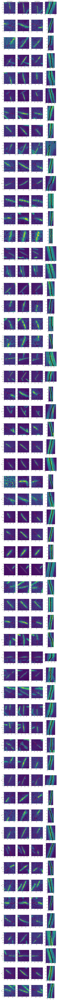

In [705]:
fig, ax = plt.subplots(len(df), 4, figsize = (12, 4*len(df)))

#iterate through each MT track
for i in range(len(df)):

    #Define the fit to the track
    xc =  df.loc[i, 'centroid-1']
    yc =  df.loc[i, 'centroid-0']
    lmajor =  df.loc[i, 'major_axis_length']
    lminor =  df.loc[i, 'minor_axis_length']
    theta = -df.loc[i, 'orientation'] + (np.pi/2)

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

    crop_win = int(lmajor/2+1)
    crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
    
    cropmajx = xmajor-xc + crop_win 
    cropmajy = ymajor-yc + crop_win 
    
    #plot the first, last, and max proj images
    ax[i][0].imshow(im_stack[start][crop])
    ax[i][1].imshow(np.amax(im_stack[start:stop], axis=0)[crop])
    ax[i][2].imshow(im_stack[stop-1][crop])
    
    #plot the fit line
    ax[i][0].plot(cropmajx, cropmajy, color='r')
    ax[i][1].plot(cropmajx, cropmajy, color='r')
    ax[i][2].plot(cropmajx, cropmajy, color='r')
    
    ax[i][0].set_ylabel(i)
    
    #create a kymograph
    mykymo = []
    for im in im_stack[start:stop]:
        ls=[]
        for j in range(len(xmajor)):
            ls.append(im[int(ymajor[j]), int(xmajor[j])])
        mykymo.append(ls)
    mykymo = np.array(mykymo)

    #Fit the kymograph and determine the speed
    speed, centroid_rsqrd, skele_rsqrd, centroid_xvals, centroid_yvals, lineparams = kymo_func(mykymo, sigma = 2, pixel_size = 0.161, plot_returns = True)
    
    #Plot the kymograph and the fit
    ax[i][3].imshow(mykymo)
    ax[i][3].scatter(centroid_xvals, centroid_yvals, color='k')
    xdex = np.arange(len(mykymo[0]))
    ax[i][3].plot(centroid_xvals, lineparams[0]*centroid_xvals+lineparams[1], color='r')
    ax[i][3].set_ylim(0, len(mykymo)-1)

ax[0][0].set_title('First Frame')
ax[0][1].set_title('Maximum Projection')
ax[0][2].set_title('Last Frame')
ax[0][3].set_title('Kymograph')

In [706]:
#Create empty lists for the speeds, r-squared values, and the number of centroids for each kymograph
speeds=[]
r2 = []
skeler2 = []

#Iterate through each MT track
for i in range(len(df)):

    # Define the line fitting the track
    xc =  df.loc[i, 'centroid-1']
    yc =  df.loc[i, 'centroid-0']
    l =  df.loc[i, 'major_axis_length']
    theta = -df.loc[i, 'orientation'] + (np.pi/2)
    
    xtrack, ytrack = mt_track(xc, yc, l, theta)
    
    #Ensure there is more than one point saved in the track line
    if len(xtrack)>1:

      # Create a kymograph
        mykymo = []

        for im in im_stack[10:61]:
            ls=[]
            for i in range(len(xtrack)):
                if int(ytrack[i])<512 and int(xtrack[i])<512:
                    ls.append(im[int(ytrack[i]), int(xtrack[i])])
            mykymo.append(ls)
        mykymo = np.array(mykymo)

        # Compute the fit to the kymograph
        speed, centroid_rsqrd, skele_rsqrd = kymo_func(mykymo, sigma = 2, pixel_size = 0.161)
        
        #Append the fit results to the empty lists
        speeds.append(speed)
        r2.append(centroid_rsqrd)
        skeler2.append(skele_rsqrd)
    
    #if there is fewer than two centroids detected in the kymograph drop the track
    else:
        df=df.drop([i])

# Include the new columns in the DataFrame
speeds = np.array(speeds)
r2 = np.array(r2)
skeler2 = np.array(skeler2)
df['speed (nm/s)'] = speeds
df['r^2'] = r2
df['skele r^2'] = skeler2

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)


In [707]:
df

,area,major_axis_length,minor_axis_length,centroid-0,centroid-1,orientation,label,speed (nm/s),r^2,num points,skele r^2
0,39,45.284171,1.861764,23.000000,349.769231,0.108463,1,55.759910,0.991170,51,0.883037
1,16,19.842269,1.794956,21.937500,431.500000,1.190831,3,49.757458,0.985254,40,0.981813
2,16,22.289795,1.450021,37.437500,365.750000,-0.628258,4,35.456425,0.785249,51,0.745688
3,22,30.608895,1.214793,62.500000,373.681818,-0.593872,9,27.879955,0.965096,51,-3.665681
4,25,29.639898,1.489571,73.000000,168.440000,0.232503,11,29.650226,0.922690,51,0.767187
5,31,35.780990,5.303255,77.129032,435.580645,0.213642,12,34.349095,0.980037,51,0.923957
6,19,22.344500,1.381642,71.789474,390.000000,1.372633,13,32.979502,0.937797,51,0.932748
7,16,24.921043,1.174350,85.500000,386.187500,0.738886,14,17.433167,0.924395,51,0.797006
8,32,39.530580,3.354868,99.312500,75.968750,-0.438967,16,12.325641,-1.631642,51,-51.813810
9,15,20.134454,1.165899,90.333333,144.000000,1.030998,18,28.783303,0.970187,51,0.921050


In [708]:
df_good = df[df['r^2']>0.8]
df_good

,area,major_axis_length,minor_axis_length,centroid-0,centroid-1,orientation,label,speed (nm/s),r^2,num points,skele r^2
0,39,45.284171,1.861764,23.000000,349.769231,0.108463,1,55.759910,0.991170,51,0.883037
1,16,19.842269,1.794956,21.937500,431.500000,1.190831,3,49.757458,0.985254,40,0.981813
3,22,30.608895,1.214793,62.500000,373.681818,-0.593872,9,27.879955,0.965096,51,-3.665681
4,25,29.639898,1.489571,73.000000,168.440000,0.232503,11,29.650226,0.922690,51,0.767187
5,31,35.780990,5.303255,77.129032,435.580645,0.213642,12,34.349095,0.980037,51,0.923957
6,19,22.344500,1.381642,71.789474,390.000000,1.372633,13,32.979502,0.937797,51,0.932748
7,16,24.921043,1.174350,85.500000,386.187500,0.738886,14,17.433167,0.924395,51,0.797006
9,15,20.134454,1.165899,90.333333,144.000000,1.030998,18,28.783303,0.970187,51,0.921050
14,32,41.773962,1.165321,119.187500,314.468750,1.074013,27,36.163077,0.992799,51,0.874053
15,31,36.229436,1.989108,145.000000,76.322581,0.158429,32,41.233484,0.991780,51,0.908246


In [709]:
df_good = df[df['r^2']>0.8][df['skele r^2']>0]
df_good


/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/2431572051.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_good = df[df['r^2']>0.8][df['skele r^2']>0]


,area,major_axis_length,minor_axis_length,centroid-0,centroid-1,orientation,label,speed (nm/s),r^2,num points,skele r^2
0,39,45.284171,1.861764,23.000000,349.769231,0.108463,1,55.759910,0.991170,51,0.883037
1,16,19.842269,1.794956,21.937500,431.500000,1.190831,3,49.757458,0.985254,40,0.981813
4,25,29.639898,1.489571,73.000000,168.440000,0.232503,11,29.650226,0.922690,51,0.767187
5,31,35.780990,5.303255,77.129032,435.580645,0.213642,12,34.349095,0.980037,51,0.923957
6,19,22.344500,1.381642,71.789474,390.000000,1.372633,13,32.979502,0.937797,51,0.932748
7,16,24.921043,1.174350,85.500000,386.187500,0.738886,14,17.433167,0.924395,51,0.797006
9,15,20.134454,1.165899,90.333333,144.000000,1.030998,18,28.783303,0.970187,51,0.921050
14,32,41.773962,1.165321,119.187500,314.468750,1.074013,27,36.163077,0.992799,51,0.874053
15,31,36.229436,1.989108,145.000000,76.322581,0.158429,32,41.233484,0.991780,51,0.908246
16,22,33.862756,1.040374,154.727273,395.090909,-0.775702,38,26.415656,0.984122,51,0.880816


In [710]:
#Save df_good
df_good.to_csv('../../analyzed_data/gliding/soichi_data/' + file_folder.split('/')[1] + '-start' + str(start) + '_stop' + str(stop) + '.csv', sep=',')

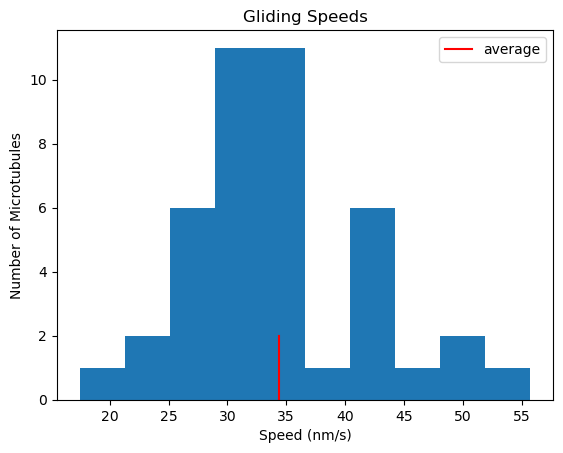

In [711]:
#plot a histogram
plt.hist(df_good['speed (nm/s)'])

#put a line at the average speed
avgspeed = np.average(df_good['speed (nm/s)'])
plt.plot([avgspeed, avgspeed], [0,2], color='r', label = 'average')

#Axis labels
plt.title('Gliding Speeds')
plt.xlabel('Speed (nm/s)')
plt.ylabel('Number of Microtubules')
plt.legend()

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_66137/4140718387.py:40: RuntimeWarning: invalid value encountered in long_scalars
  com = np.sum(row_vals*xindex)/np.sum(row_vals)
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/i

Text(0.5, 1.0, 'Kymograph')

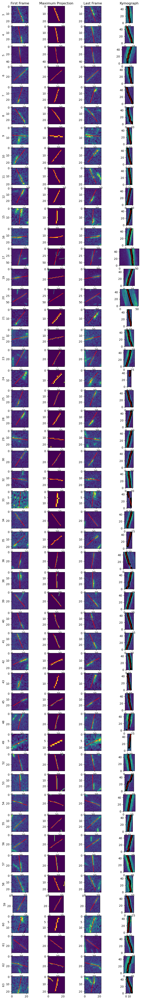

In [646]:
fig, ax = plt.subplots(len(df_good), 4, figsize = (9, len(df)))
for i, index in enumerate(df_good.index):
    xc =  df_good.loc[index, 'centroid-1']
    yc =  df_good.loc[index, 'centroid-0']
    lmajor =  df_good.loc[index, 'major_axis_length']
    lminor =  df_good.loc[index, 'minor_axis_length']
    theta = -df_good.loc[index, 'orientation'] + (np.pi/2)

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

    crop_win = int(lmajor/2+1)
    crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
    
    cropmajx = xmajor-xc + crop_win 
    cropmajy = ymajor-yc + crop_win 
    
    ax[i][0].imshow(im_stack[start][crop])
    ax[i][1].imshow(im_cleaned[crop])
    ax[i][2].imshow(im_stack[stop-1][crop])
    
    ax[i][0].plot(cropmajx, cropmajy, color='r')
    ax[i][1].plot(cropmajx, cropmajy, color='r')
    ax[i][2].plot(cropmajx, cropmajy, color='r')
    
    ax[i][0].set_ylabel(index)

    mykymo = []
    for im in im_stack[start:stop]:
        ls=[]
        for j in range(len(xmajor)):
            ls.append(im[int(ymajor[j]), int(xmajor[j])])
        mykymo.append(ls)
    mykymo = np.array(mykymo)
    
    speed, centroid_rsqrd, skele_rsqrd, centroid_xvals, centroid_yvals, lineparams = kymo_func(mykymo, sigma = 2, pixel_size = 0.161, plot_returns = True)
    
    ax[i][3].imshow(mykymo)
    ax[i][3].scatter(centroid_xvals, centroid_yvals, color='k')
    xdex = np.arange(len(mykymo[0]))
    ax[i][3].plot(centroid_xvals, lineparams[0]*centroid_xvals+lineparams[1], color='r')
    ax[i][3].set_ylim(0, len(mykymo)-1)

ax[0][0].set_title('First Frame')
ax[0][1].set_title('Maximum Projection')
ax[0][2].set_title('Last Frame')
ax[0][3].set_title('Kymograph')

<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


Text(0.5, 1.0, 'Otsu')

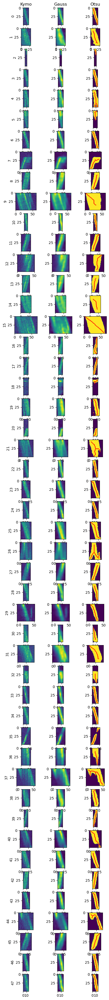

In [138]:
fig, ax = plt.subplots(len(df.index), 3, figsize=(5,50))

for i, index in enumerate(df.index):
    xc =  df.loc[index, 'centroid-1']
    yc =  df.loc[index, 'centroid-0']
    lmajor =  df.loc[index, 'major_axis_length']
    lminor =  df.loc[index, 'minor_axis_length']
    theta = -df.loc[index, 'orientation'] + (np.pi/2)

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

#     crop_win = int(lmajor/2+1)
#     crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]
    
#     cropmajx = xmajor-xc + crop_win 
#     cropmajy = ymajor-yc + crop_win 
    
#     ax[i][0].imshow(im_stack[start][crop])
#     ax[i][1].imshow(im_cleaned[crop])
#     ax[i][2].imshow(im_stack[stop-1][crop])
    
#     ax[i][0].plot(cropmajx, cropmajy, color='r')
#     ax[i][1].plot(cropmajx, cropmajy, color='r')
#     ax[i][2].plot(cropmajx, cropmajy, color='r')
    
    ax[i][0].set_ylabel(index)

    mykymo = []
    for im in im_stack[start:stop]:
        ls=[]
        for j in range(len(xmajor)):
            ls.append(im[int(ymajor[j]), int(xmajor[j])])
        mykymo.append(ls)
    mykymo = np.array(mykymo)
    gauss = sf.gaussian(mykymo, sigma=2)
    ax[i][0].imshow(mykymo)
    ax[i][1].imshow(gauss)
    
    ax[i][2].imshow(gauss > sf.threshold_otsu(gauss))
    skelex, skeley, skele_param, skele_speed, skele_rsqrd = skeletonfit(gauss > sf.threshold_otsu(gauss), pixel_size=0.161)
    ax[i][2].scatter(skelex, skeley, color='r', s=0.5)
    
#     ax[i][3].imshow(gauss > sf.threshold_li(gauss))
#     skelex, skeley, skele_param, skele_speed, skele_rsqrd = skeletonfit(gauss > sf.threshold_li(gauss), pixel_size=0.161)
#     ax[i][3].scatter(skelex, skeley, color='r', s=0.5)
    
    
#     ax[i][4].imshow(gauss > sf.threshold_minimum(gauss))
#     skelex, skeley, skele_param, skele_speed, skele_rsqrd = skeletonfit(gauss > sf.threshold_minimum(gauss), pixel_size=0.161)
#     ax[i][4].scatter(skelex, skeley, color='r', s=0.5)
    
    
#     ax[i][5].imshow(gauss > sf.threshold_triangle(gauss))
#     skelex, skeley, skele_param, skele_speed, skele_rsqrd = skeletonfit(gauss > sf.threshold_triangle(gauss), pixel_size=0.161)
#     ax[i][5].scatter(skelex, skeley, color='r', s=0.5)
    

ax[0][0].set_title('Kymo')
ax[0][1].set_title('Gauss')
ax[0][2].set_title('Otsu')
# ax[0][3].set_title('Li')
# ax[0][4].set_title('Min')
# ax[0][5].set_title('Tri')

# Max proj minus last frame

Analyze last frame

In [ ]:
edge=3
last = im_stack[60]
#### normalize the image ####
last_norm = (last - im_max.min())/(im.max() - im_max.min())
last_norm[np.where(last_norm<0)]=0

#### niblack threshold ####
last_niblack = filters.threshold_niblack(last_norm, window_size= 3, k=0.001)

#### Otsu threshold ####
last_otsu = filters.threshold_otsu(last_niblack)
last_thresh = (last_niblack > last_otsu)

#### Label ####
last_label, n_label = measure.label(last_thresh, return_num=True)
unique_regions, region_counts = np.unique(last_label, return_counts = True)

#### remove borders ####  
last_border = np.copy(last_label)
#Make the border mask
border = np.ones(np.shape(last_label))
border[edge:-1*edge, edge:-1*edge] -=1
#Ask if there is a nonzero label within the border region and if so remove that patch
for n in np.unique(last_border):
    if np.any(border*[last_border==n+1]):
        last_border[last_border==n+1] = 0
#Save image with border patches eliminated
last_internal = last_border

In [ ]:
im_proc_binary = np.copy(im_internal)
im_proc_binary[np.where(im_proc_binary>0)]=1

last_proc_binary = np.copy(last_internal)
last_proc_binary[np.where(last_proc_binary>0)]=1

im_sub = im_proc_binary-last_proc_binary
im_sub_label = measure.label(im_sub)

fig, ax = plt.subplots(1,3, figsize=(16,8))
ax[0].imshow(im_proc_binary, vmin=0, vmax=1)
ax[1].imshow(im_sub, vmin=0, vmax=1)
ax[2].imshow(last_proc_binary, vmin=0, vmax=1)

### Find lines in subtracted image

In [ ]:
# Define a size threhshold
area_thresh = 20

#Make a dictionary that connects the region label number and the number of pixels within said region
dict_area = dict(zip(unique_regions, region_counts))

#Want to find if each patch is big enough
sub_sized = np.copy(im_sub_label)
for label in unique_regions:
  #ask if region is larger than threshold
  if label>0 and dict_area[label]<=area_thresh:
    sub_sized[sub_sized==label] = 0

#plot
plt.imshow(sub_sized)

In [ ]:
#create skeletons that preserve connectivity
sub_thinned = morphology.thin(im_sub_label)

#Relabel so each skelton has its own label I.D
sub_relabel = measure.label(sub_thinned)

#plot
plt.imshow(sub_relabel, vmin=0, vmax=0.5)

In [ ]:
# Set scanning parameters
padding=1
min_dist=1
min_angle=5

# Make a copy of the image
sub_cleaned = sub_relabel.copy()

#Define angles to test lines over
test_angles = np.linspace(-np.pi / 2, np.pi / 2, 360)

#Perform the transform for each labeled region
for n in np.unique(sub_relabel)[1:]:
    x,y = np.where(sub_relabel==n)
    mt_segment = sub_relabel[x.min()-padding:x.max()+padding,y.min()-padding:y.max()+padding]

    h, theta, d = transform.hough_line(mt_segment, theta=test_angles)
    _, angles, _ = transform.hough_line_peaks(h, theta, d, 
                                            min_distance=min_dist,
                                            min_angle=min_angle,
                                            num_peaks=2)
    
    # If more than one line is fit to the region, eliminate the region from our image
    if len(angles)>=2:
        sub_cleaned = np.where(sub_cleaned==n, 0, sub_cleaned)

#Plot
plt.imshow(sub_cleaned,vmin=0, vmax=0.5)

In [ ]:
len(im_stack)

# Movie

In [47]:
#Movie
import celluloid as cell
import matplotlib.animation as animation

Save each track as its own movie

Save all tracks in the same movie

  0%|          | 0/45 [00:00<?, ?it/s]

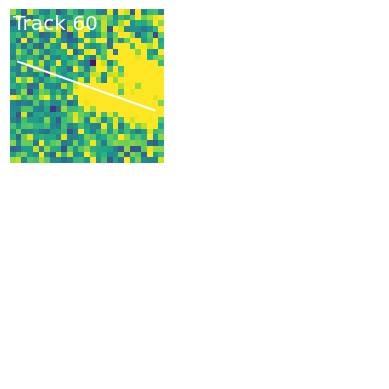

In [48]:
fig,ax = plt.subplots()
camera = cell.Camera(fig)
for index in tqdm(df_good.index):
    xc =  df_good.loc[index, 'centroid-1']
    yc =  df_good.loc[index, 'centroid-0']
    lmajor =  df_good.loc[index, 'major_axis_length']
    theta = -df_good.loc[index, 'orientation'] + (np.pi/2)

    crop_width = int(lmajor/2+1)
    crop_win = np.s_[int(yc-crop_width) : int(yc+crop_width+1), int(xc-crop_width) : int(xc+crop_width+1)]

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    cropmajx = xmajor-xc + crop_width 
    cropmajy = ymajor-yc + crop_width

    for i, im in enumerate(im_stack[start:stop]):
        im_temp = im[crop_win]
        ax.imshow(im_temp, vmin=100, vmax=500, animated = True)
        ax.plot(cropmajx, cropmajy, color='w')
        ax.text(0,3, s='Track ' + str(index), color='w', fontsize = 'x-large')
        ax.axis('off')
        camera.snap()

animation = camera.animate()
animation.save("Good_MT_Track-Soichi500uM_8.mp4", fps = 50)

In [ ]:
fig,ax = plt.subplots()
camera = cell.Camera(fig)
for index in tqdm(df.index):
    xc =  df.loc[index, 'centroid-1']
    yc =  df.loc[index, 'centroid-0']
    lmajor =  df.loc[index, 'major_axis_length']
    theta = -df.loc[index, 'orientation'] + (np.pi/2)

    crop_width = int(lmajor/2+1)
    crop_win = np.s_[int(yc-crop_width) : int(yc+crop_width+1), int(xc-crop_width) : int(xc+crop_width+1)]

    xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
    cropmajx = xmajor-xc + crop_width 
    cropmajy = ymajor-yc + crop_width

    for i, im in enumerate(im_stack[start:stop]):
        im_temp = im[crop_win]
        ax.imshow(im_temp, vmin=100, vmax=500, animated = True)
        ax.plot(cropmajx, cropmajy, color='w')
        ax.text(0,3, s='Track ' + str(index), color='w', fontsize = 'x-large')
        
        if len(np.where(df_good.index == index)[0])==1:
            plt.text(0,5.5, s='good', color='w', fontsize = 'x-large')
        
        ax.axis('off')
        camera.snap()

animation = camera.animate()
animation.save("All_MT_Track.mp4", fps = 50)

# Individual MT Fits

In [ ]:
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm

cnorm = mcolors.Normalize(vmin=plot_frames.min(), vmax=plot_frames.max())
cmap = cm.rainbow
scalarmap = cm.ScalarMappable(norm=cnorm, cmap=cmap)
scalarmap.set_array(plot_frames)

In [ ]:
windows = []
for index in df_good.index:
    xc =  df_good.loc[index, 'centroid-1']
    yc =  df_good.loc[index, 'centroid-0']
    lmajor =  df_good.loc[index, 'major_axis_length']

    crop_width = int(lmajor/2+1)
    crop_win = np.s_[int(yc-crop_width) : int(yc+crop_width+1), int(xc-crop_width) : int(xc+crop_width+1)]
    windows.append(crop_win)


Create an array with cropped images to microtubule regions for each acquisition time. First index is the time point second index is each cropped region

In [ ]:
crop_stack = []
for t in plot_frames:
    crop_im = []
    for win in windows:
        crop_im.append(im_stack[start:stop][t][win])
    crop_stack.append(crop_im)
crop_stack = np.array(crop_stack, dtype=object)
        

In [ ]:
edge=3
crop_proc_stack = []
for crops in crop_stack:
    crop_proc = []
    for crop in crops:
        #### normalize the image ####
        crop_norm = (crop - crop.min())/(crop.max() - crop.min())
        
        #### niblack threshold ####
        crop_niblack = filters.threshold_niblack(crop_norm, window_size= 3, k=0.001)
        
        #### Otsu threshold ####
        crop_otsu = filters.threshold_otsu(crop_niblack)
        crop_thresh = (crop_niblack > crop_otsu)

        #### Label ####
        crop_label, n_label = measure.label(crop_thresh, return_num=True)
        unique_regions, region_counts = np.unique(crop_label, return_counts = True)
        
        #### remove borders ####  
        crop_border = np.copy(crop_label)
        #Make the border mask
        border = np.ones(np.shape(crop_label))
        border[edge:-1*edge, edge:-1*edge] -=1
        #Ask if there is a nonzero label within the border region and if so remove that patch
        for n in np.unique(crop_border):
            if np.any(border*[crop_border==n+1]):
                crop_border[crop_border==n+1] = 0
        #Save image with border patches eliminated
        crop_internal = crop_border

        #### Append ####
        crop_proc.append(crop_internal)
    crop_proc_stack.append(crop_proc)
crop_proc_stack = np.array(crop_proc_stack, dtype=object)

In [ ]:
np.shape(crop_proc_stack)

Plot all the processed crop photos

In [ ]:
fig, ax = plt.subplots(len(crop_proc_stack), len(crop_proc_stack[0]), figsize = (len(crop_proc_stack), 20*len(crop_proc_stack[0])))
for t, time in enumerate(tqdm(crop_proc_stack)):
    for i, crop_proc in enumerate(time):
        ax[t][i].imshow(crop_proc)

Find centroids for all the procesed cropped photos

In [ ]:
# Determine properties - we will need the centroid, major axis length etc

props_stack = []

for t, time in enumerate(crop_proc_stack):
    for i, crop_proc in enumerate(time):
        crop_props = measure.regionprops_table(crop_proc, 
                                     crop_stack[t][i], 
                                     properties = ['area', 
                                                    'major_axis_length', 
                                                    'centroid', 
                                                    'orientation'])
        crop_props = pd.DataFrame(crop_props)
        
        xc =  df_good.loc[df_good.index[i], 'centroid-1']
        yc =  df_good.loc[df_good.index[i], 'centroid-0']
        lmajor =  df_good.loc[df_good.index[i], 'major_axis_length']
        crop_win = int(lmajor/2+1)
        
        crop_props['centroid-0'] = crop_props['centroid-0'] + (yc - crop_win)
        crop_props['centroid-1'] = crop_props['centroid-1'] + (xc - crop_win)
        
        crop_props['time'] = np.ones(len(crop_props))*plot_frames[t]
        crop_props['track label'] = np.ones(len(crop_props))*df_good.index[i]
        props_stack.append(crop_props)
        
#Save as dataframe
df_stack = pd.concat(props_stack).reset_index()

# #Show the dataframe
df_stack

In [ ]:
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm

cnorm = mcolors.Normalize(vmin=plot_frames.min(), vmax=plot_frames.max())
cmap = cm.rainbow

for t in np.unique(df_stack['time']):
    plt.scatter(df_stack[df_stack['time']==t]['centroid-1'], df_stack[df_stack['time']==t]['centroid-0'], color=cmap(cnorm(t)), s=2)
plt.imshow(im_cleaned)#,vmin=200, vmax=500)
# plt.ylim(250, 310)
# plt.xlim(280, 330)

In [ ]:
index = 4

xc =  df_good.loc[index, 'centroid-1']
yc =  df_good.loc[index, 'centroid-0']
lmajor =  df_good.loc[index, 'major_axis_length']
lminor =  df_good.loc[index, 'minor_axis_length']
theta = -df_good.loc[index, 'orientation'] + (np.pi/2)

xmajor, ymajor = mt_track(xc, yc, lmajor, theta)
xminor, yminor = mt_track(xc, yc, lminor, theta-np.pi/2)

crop_win = int(lmajor/2+1)
crop = np.s_[int(yc-crop_win) : int(yc+crop_win+1), int(xc-crop_win) : int(xc+crop_win+1)]

cropmajx = xmajor-xc + crop_win 
cropmajy = ymajor-yc + crop_win 

In [ ]:
singim = im_stack[20][crop]
plt.imshow(singim)

In [ ]:
sing_norm = (singim - singim.min())/(singim.max() - singim.min())
plt.imshow(sing_norm)

In [ ]:
sing_niblack = filters.threshold_niblack(sing_norm, window_size= 3, k=0.001)
plt.imshow(sing_niblack)

In [ ]:
# define the threshold
sing_otsu = filters.threshold_otsu(sing_niblack)

#Make a binary image where values above the threshold are = 1 and all else is 0
sing_thresh = (sing_niblack > sing_otsu)

#Plot
plt.imshow(sing_thresh)

In [ ]:
#make a image with each patch labeled a unique number
sing_label, singn_label = measure.label(sing_thresh, return_num=True)

#save the unique labels
singunique_regions, singregion_counts = np.unique(sing_label, return_counts = True)

#plot
plt.imshow(sing_label)

In [ ]:
#give some border width
edge = 3

#make an image that will have the border removed
sing_border = np.copy(sing_label)

#Make the border mask
border = np.ones(np.shape(sing_label))
border[edge:-1*edge, edge:-1*edge] -=1

#Ask if there is a nonzero label within the border region and if so remove that patch
for n in np.unique(sing_border):
    if np.any(border*[sing_border==n+1]):
        sing_border[sing_border==n+1] = 0

#Save image with border patches eliminated
sing_internal = sing_border

#plot
plt.imshow(sing_internal)

In [ ]:
# Determine properties - we will need the centroid, major axis length etc
sing_props = measure.regionprops_table(sing_internal, 
                                     sing_norm, 
                                     properties = ['area', 
                                                    'major_axis_length', 
                                                    'minor_axis_length', 
                                                    'centroid', 
                                                    'orientation', 
                                                    'label'])
#Save as dataframe
singdf = pd.DataFrame(sing_props)

#Show the dataframe
singdf

In [ ]:
plt.imshow(sing_internal)
plt.scatter(singdf['centroid-1'], singdf['centroid-0'], color='r')